# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 2. Простой анализ данных.

**Правила, <font color="red">прочитайте внимательно</font>:**

* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`** и html-версии графиков (подробности в условии).
* Телеграм не разрешает боту получать файлы более **20 Мб**. Если ваше решение весит больше, *заранее* разделите ноутбук на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания **используйте этот ноутбук в качестве основы, ничего не удаляя из него**. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.

**Перед выполнением задания посмотрите презентацию по выполнению и оформлению домашних заданий с занятия 1.**

---

**Баллы за задание:**

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 2 &mdash; 80 баллов

---

In [96]:
# Bot check

# HW_ID: fpmi_ad2
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то

# Status: final
# Перед отправкой в финальном решении удали "not" в строчке выше
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную

In [97]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly_express as px

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')


---
### <font color="orange"><i>Сложная часть</i></font>

### Задача 2

<a target="_blank" href="https://www.yelp.com/">Yelp</a> — веб-сайт для поиска на местном рынке услуг, например ресторанов или парикмахерских, с возможностью добавлять и просматривать рейтинги и обзоры этих услуг. Для популярных бизнесов имеются сотни обзоров. Для обозревателей на сайте предусмотрены элементы социальной сети.

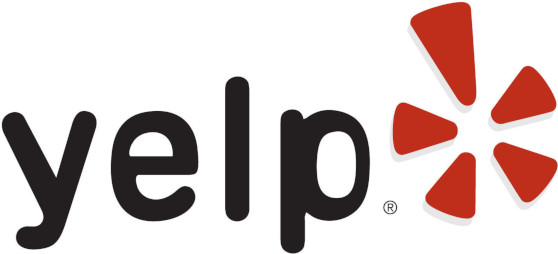

_____________

Вам предоставляется следующая информация о компаниях на Yelp:

Файл `yelp_business.csv`:
* `business_id` — уникальный идентификатор компании;
* `name` — имя компании;
* `address`, `city`, `state` — месторасположении компании;
* `latitude`, `longitude` — географические координаты;
* `categories` — категории услуг компании.

Файл `yelp_review.csv`, содержащий оценки пользователей:
* `business_id` — идентификатор компании, соответствующий файлу `yelp_business.csv`;
* `stars` — поставленная пользователем оценка от 1 до 5.

В целях сокращения объема файла, текстовые отзывы пользователей не были включены.

Оригинальную версию датасета в формате `json` можно посмотреть по <a target="_blank" href="https://www.kaggle.com/yelp-dataset/yelp-dataset/data">ссылке</a>, но использовать нужно выданные данные.

_____________

**Что нужно сделать:** 

* Найти город с наибольшим количеством компаний;
* Для этого города определить районы с наиболее качественными услугами. <a target="_blank" href="https://yandex.ru/company/researches/2017/msk_mobile_map">Пример</a> с несколько другой задачей.
* А также найти рестораны с наилучшими отзывами.


*Далее в условии встречаются различные подсказки, как можно выполнить определенные части задачи. Вы можете их игнорировать и делать иным способом для получения **того же самого промежуточного результата**. Однако, если ваше решение окажется **значительно** менее эффективным (по скорости, количеству и красоте кода) по сравнению с предполагаемым, баллы могут быть снижены.* 

------

#### 1. Город с наибольшим количеством компаний

Загрузите данные из файла `yelp_business.csv` с помощью функции `pd.read_csv`. Посмотрите на первые несколько строк с помощью метода `head`.

In [98]:
data = pd.read_csv('yelp_business.csv', index_col=0)
data.head(5)

,business_id,name,neighborhood,address,city,state,postal_code,latitude,longitude,is_open,categories
0,FYWN1wneV18bWNgQjJ2GNg,"""Dental by Design""",NaN,"""4855 E Warner Rd, Ste B9""",Ahwatukee,AZ,85044,33.330690,-111.978599,1,Dentists;General Dentistry;Health & Medical;Or...
1,He-G7vWjzVUysIKrfNbPUQ,"""Stephen Szabo Salon""",NaN,"""3101 Washington Rd""",McMurray,PA,15317,40.291685,-80.104900,1,Hair Stylists;Hair Salons;Men's Hair Salons;Bl...
2,KQPW8lFf1y5BT2MxiSZ3QA,"""Western Motor Vehicle""",NaN,"""6025 N 27th Ave, Ste 1""",Phoenix,AZ,85017,33.524903,-112.115310,1,Departments of Motor Vehicles;Public Services ...
3,8DShNS-LuFqpEWIp0HxijA,"""Sports Authority""",NaN,"""5000 Arizona Mills Cr, Ste 435""",Tempe,AZ,85282,33.383147,-111.964725,0,Sporting Goods;Shopping
4,PfOCPjBrlQAnz__NXj9h_w,"""Brick House Tavern + Tap""",NaN,"""581 Howe Ave""",Cuyahoga Falls,OH,44221,41.119535,-81.475690,1,American (New);Nightlife;Bars;Sandwiches;Ameri...


Найдите пять городов, по которым присутствует информация о наибольшем количестве компаний. В таблице должен быть указан город (название) и количество компаний в этом городе.

*Подсказка.* Для выполнения стоит воспользоваться методами `groupby`, `count`, `sort_values`, `head`.

In [99]:
city_companies_count = data.groupby(['city'])['business_id'].count()
top_five_cities = city_companies_count.sort_values(ascending=False).head(5)
top_five_cities


city
Las Vegas     26775
Phoenix       17213
Toronto       17206
Charlotte      8553
Scottsdale     8228
Name: business_id, dtype: int64

Пусть `N` &mdash; город с наибольшим количеством компаний. Оставьте в таблице только записи, соответствующие городу `N`. Нанесите все эти компании на график, в котором по оси $x$ отметьте долготу, а по оси $y$ &mdash; широту.

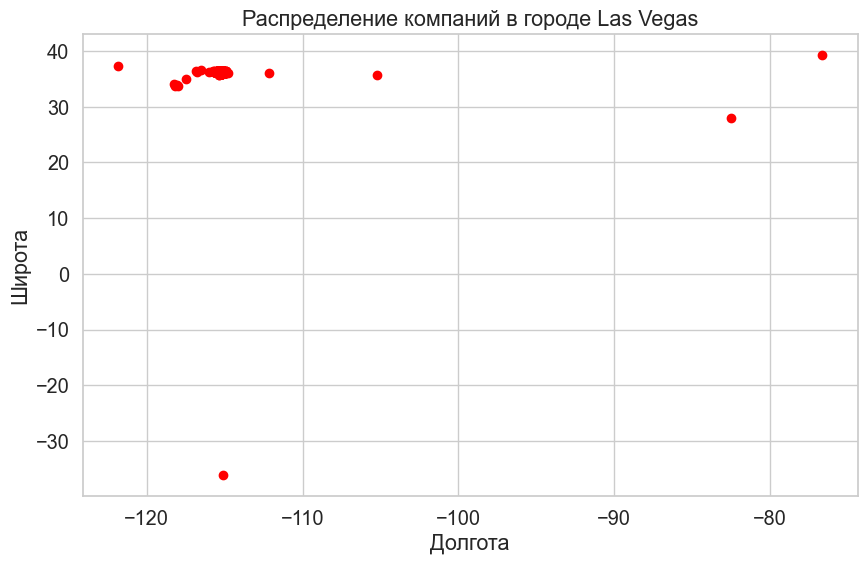

In [100]:
biggest_city = 'Las Vegas'
filtered_data = data[data['city'] == biggest_city]
plt.figure(figsize=(10, 6))
plt.scatter(filtered_data['longitude'], filtered_data['latitude'], color='red')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.title('Распределение компаний в городе Las Vegas')
plt.show()



Сам город находится в сгустке точек. Есть какие-то компании, которые приписаны к этому городу, но находятся далеко от него. Избавьтесь от них, подобрав некоторые границы значений широты и долготы. Изобразите все компании на новом графике. На этом графике должны выделяться некоторые улицы. 

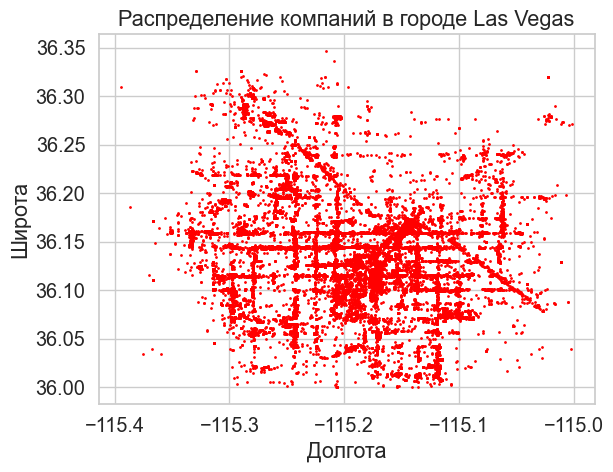

In [101]:
closest_points = filtered_data[(filtered_data['longitude'] > -115.4) & (filtered_data['longitude'] < -115) & (filtered_data['latitude'] > 36) & (filtered_data['latitude'] < 36.35)]
plt.scatter(closest_points['longitude'], closest_points['latitude'], color='red', s = 1)
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.title('Распределение компаний в городе Las Vegas')
plt.show()

Разберитесь с тем, как подгрузить интерактивную карту города в качестве фона графика. Можно пойти двумя следующими способами.
1. Изучить <a href="https://miptstats.github.io/courses/python/11_plotly.html" target="_blank">материалы</a> по библиотеке <a href="https://plotly.com/python/" target="_blank"><b>Plotly</b></a>. Возможно, потребуется также заглянуть в документацию.
1. Поразбираться с библиотекой <a href="https://github.com/python-visualization/folium" target="_blank"><b>Folium</b></a>. Посмотрите множество <a href="https://nbviewer.org/github/python-visualization/folium/tree/main/examples/" target="_blank">примеров</a>, может также помочь <a href="https://proglib.io/p/python-web-map" target="_blank">статья на русском</a>.

*Внимание!* Интерактивная карта может не сохраниться в ноутбуке, а если сохранится, то вес ноутбука может превзойти 20 Мб, и его не получится отправить боту. В любом случае **<u>необходимо сохранить карту в html и отправить ее отдельным файлом в бот.</u>** При этом каждый файл html должен не превышать 20 Мб, присылать файлы в архиве нельзя. Аналогично со всеми следующими интерактивными графиками в этом задании.

In [102]:
fig = px.scatter_mapbox(closest_points, 
                        lat="latitude", 
                        lon="longitude", 
                        hover_name="name", 
                        hover_data=["categories"], 
                        zoom=11, 
                        title = "Интерактивная карта Лас Вегаса",
                        height=800)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Если все получилось, вы молодцы! Далее в этой задаче тоже стройте интерактивные карты. Если нет желания разбираться с интерактивными графиками, можно построить статичные, но баллы будут снижены.

#### 2. Оценки компаний

Для выполнения задания нужно посчитать среднюю оценку каждой компании, а также количество выставленных оценок.

Загрузите таблицу оценок `yelp_review.csv`.

In [103]:
rating_data = pd.read_csv('yelp_review.csv', index_col=0)
rating_data.head()

,business_id,stars
0,AEx2SYEUJmTxVVB18LlCwA,5
1,VR6GpWIda3SfvPC-lg9H3w,5
2,CKC0-MOWMqoeWf6s-szl8g,5
3,ACFtxLv8pGrrxMm6EgjreA,4
4,s2I_Ni76bjJNK9yG60iD-Q,4


В подгруженной таблице оценок оставьте только компании города `N`. Для этого установите значения `business_id` в качестве индекса у таблицы оценок и воспользуйтесь методом `loc`. 

*Подсказка.* Чтобы индекс снова сделать полем таблицы, можно воспользоваться методом `reset_index`.

In [104]:
# Установить 'business_id' в качестве индекса в таблице оценок
rating_data.set_index('business_id', inplace=True)

# Оставить только компании города N
rating_data_N = rating_data.loc[data[data['city'] == 'Las Vegas']['business_id']]

# Вернуть индекс в виде поля таблицы
rating_data_N.reset_index(inplace=True)
rating_data_N

,business_id,stars
0,kCoE3jvEtg6UVz5SOD3GVw,4
1,kCoE3jvEtg6UVz5SOD3GVw,1
2,kCoE3jvEtg6UVz5SOD3GVw,5
3,kCoE3jvEtg6UVz5SOD3GVw,5
4,kCoE3jvEtg6UVz5SOD3GVw,5
...,...,...
1604222,9ouC6BpmjFpLfHeQnLQqng,5
1604223,9ouC6BpmjFpLfHeQnLQqng,5
1604224,n9a-3YhibkMDUEgncIivHg,5
1604225,n9a-3YhibkMDUEgncIivHg,1


Теперь посчитайте среднюю оценку каждой компании, а также количество выставленных компании оценок. 

*Подсказка.* Помочь в этом могут функции `groupby` и `aggregate([np.mean, np.size])`.

In [105]:
# Соеденим две таблицы по business_id
merged_data = pd.merge(closest_points, rating_data_N, on = 'business_id')
# Посчитаем среднее значение по каждому имени и количество имен
mean_data = merged_data.groupby('name')['stars'].aggregate(['mean', 'size']).reset_index()
# Переименуем колонки
mean_data.columns = ['name','average_stars', 'count']
#Соедними получившийся датафрейм с исходным по имени
full_data = pd.merge(closest_points, mean_data, on='name', how='left')
cols = ['business_id', 'name', 'average_stars', 'count']
#Оставим только нужные колонки
mean_data = full_data[cols]
mean_data

,business_id,name,average_stars,count
0,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",4.000000,5
1,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",1.444444,9
2,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",4.739130,23
3,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",4.450000,20
4,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",3.416667,204
...,...,...,...,...
26425,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",4.466667,15
26426,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",2.921372,5189
26427,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",2.735065,385
26428,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",5.000000,5


Назовите колонки таблицы красивыми именами, изменив `<имя таблицы>.columns`, после чего напечатайте несколько строк полученной таблицы. Красивые имена &mdash; то, что будет понятно простому человеку при чтении ваших результатов. Как именно их назвать &mdash; задача аналитика, то есть в данном случае ваша :)

In [106]:
mean_data

,business_id,name,average_stars,count
0,kCoE3jvEtg6UVz5SOD3GVw,"""BDJ Realty""",4.000000,5
1,OD2hnuuTJI9uotcKycxg1A,"""Soccer Zone""",1.444444,9
2,VBHEsoXQb2AQ76J9l8h1uQ,"""Alfredo's Jewelry""",4.739130,23
3,1Jp_hmPNUZArNqzpbm7B0g,"""Task Electric""",4.450000,20
4,DPQnTnNw2PJj7DdENM98Cw,"""Star Nursery""",3.416667,204
...,...,...,...,...
26425,swjz4q8gI79Ndg4APuHEUA,"""Stonegate Real Estate Services""",4.466667,15
26426,pUhU5ohYv65g8B47dTXAKA,"""Starbucks""",2.921372,5189
26427,sH9WsMj8sNTTSAUWv4UEEg,"""Sprint Store""",2.735065,385
26428,9ouC6BpmjFpLfHeQnLQqng,"""9 Dragons Fight Shop""",5.000000,5


Соедините две полученные ранее таблицы по компаниям города `N` в одну.
Для этого сначала установите поле `business_id` в качестве индекса в обеих таблицах с помощью `set_index`. В одной из них это уже должно было быть сделано.
В полученной таблице должны получится поля `latitude`, `longitude`, `categories`, `name`, а также две колонки со средней оценкой компаний и количеством оценок, которые вы посчитали выше.

*Подсказка.* Соединение таблиц можно выполнить с помощью `join`.
Индексы у этих таблиц одинаковые, так что тип джойна не имеет значения.

In [107]:
cols = ['business_id', 'latitude', 'longitude', 'categories', 'name', 'average_stars', 'count']
main_data = full_data[cols]
main_data

,business_id,latitude,longitude,categories,name,average_stars,count
0,kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5
1,OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9
2,VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23
3,1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20
4,DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.416667,204
...,...,...,...,...,...,...,...
26425,swjz4q8gI79Ndg4APuHEUA,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15
26426,pUhU5ohYv65g8B47dTXAKA,36.173589,-115.116779,Coffee & Tea;Food,"""Starbucks""",2.921372,5189
26427,sH9WsMj8sNTTSAUWv4UEEg,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",2.735065,385
26428,9ouC6BpmjFpLfHeQnLQqng,36.128780,-115.208990,Martial Arts;Sports Wear;Men's Clothing;Sporti...,"""9 Dragons Fight Shop""",5.000000,5


Изобразите все компании на графике, раскрасив точку в цвет, оттенок которого соответствует средней оценке компании. Прозрачность точки выставляйте не более $0.3$. Если у одной компании несколько филиалов с разными адресами, наносите на график все адреса.

In [108]:
fig = px.scatter_mapbox(main_data, 
                        lat="latitude",
                        lon="longitude", 
                        color = 'average_stars', 
                        opacity=0.3, hover_name="name", 
                        hover_data=["categories"], 
                        zoom=11, 
                        title = "Интерактивная карта Лас Вегаса",
                        height=800)
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Чтобы получить районы города, то есть разделить город на "клетки", округлите значения широты и долготы, подобрав оптимальный размер района. 

*Подсказка.* Например, можно сделать так
`np.round(долгота*4, decimals=1)*0.25`.

In [109]:
# По формуле посчитаем округленные значения долготы и широты
main_data['rounded_longitude'] = np.round(main_data['longitude'] * 4, decimals=1) * 0.25
main_data['rounded_latitude'] = np.round(main_data['latitude'] * 4, decimals=1) * 0.25
main_data


C:\Users\pinma\AppData\Local\Temp\ipykernel_12476\3411595045.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\pinma\AppData\Local\Temp\ipykernel_12476\3411595045.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,business_id,latitude,longitude,categories,name,average_stars,count,rounded_longitude,rounded_latitude
0,kCoE3jvEtg6UVz5SOD3GVw,36.207430,-115.268460,Real Estate Services;Real Estate;Home Services...,"""BDJ Realty""",4.000000,5,-115.275,36.200
1,OD2hnuuTJI9uotcKycxg1A,36.197484,-115.249660,Shopping;Sporting Goods,"""Soccer Zone""",1.444444,9,-115.250,36.200
2,VBHEsoXQb2AQ76J9l8h1uQ,36.085051,-115.119421,Shopping;Jewelry;Watch Repair;Local Services,"""Alfredo's Jewelry""",4.739130,23,-115.125,36.075
3,1Jp_hmPNUZArNqzpbm7B0g,36.056382,-115.269332,Home Services;Lighting Fixtures & Equipment;Lo...,"""Task Electric""",4.450000,20,-115.275,36.050
4,DPQnTnNw2PJj7DdENM98Cw,36.105196,-115.056880,Nurseries & Gardening;Home & Garden;Shopping,"""Star Nursery""",3.416667,204,-115.050,36.100
...,...,...,...,...,...,...,...,...,...
26425,swjz4q8gI79Ndg4APuHEUA,36.134355,-115.224462,Real Estate Services;Home Services;Property Ma...,"""Stonegate Real Estate Services""",4.466667,15,-115.225,36.125
26426,pUhU5ohYv65g8B47dTXAKA,36.173589,-115.116779,Coffee & Tea;Food,"""Starbucks""",2.921372,5189,-115.125,36.175
26427,sH9WsMj8sNTTSAUWv4UEEg,36.055130,-115.243488,Mobile Phone Accessories;Mobile Phones;Electro...,"""Sprint Store""",2.735065,385,-115.250,36.050
26428,9ouC6BpmjFpLfHeQnLQqng,36.128780,-115.208990,Martial Arts;Sports Wear;Men's Clothing;Sporti...,"""9 Dragons Fight Shop""",5.000000,5,-115.200,36.125


Для получения средней оценки компаний по району постройте сводную таблицу при помощи `pd.pivot_table`, взяв в качестве индексов и колонок округленные широту и долготу, а в качестве значений &mdash; оценки. Аггрегирующей функцией является среднее.

Изобразите полученную таблицу при помощи `sns.heatmap`.

*Замечание.* В качестве среднего можно было бы посчитать как общее среднее по всем оценкам всех компаний, так и среднее по компаниям их средних оценок. В чем разница этих подходов? Какой из них необходимо использовать в данном случае?

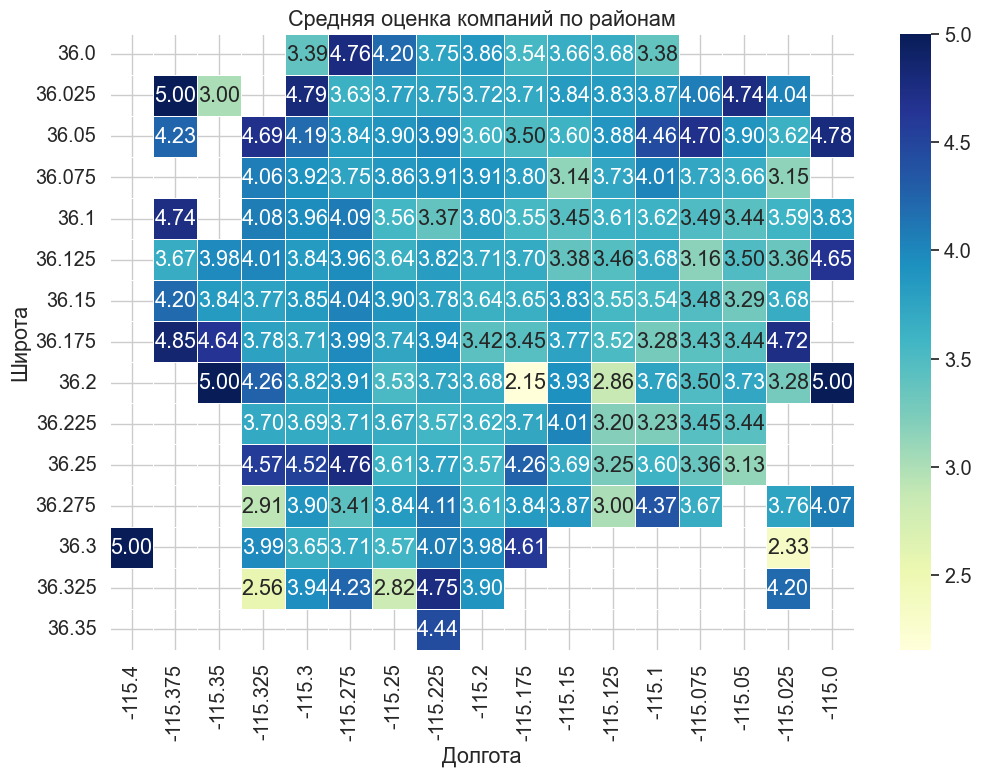

In [110]:
pivot_table = pd.pivot_table(main_data, values = 'average_stars', index='rounded_latitude', columns='rounded_longitude', aggfunc='mean')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=.5)
plt.title('Средняя оценка компаний по районам')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()

Полученный график имеет ряд недостатков. Во-первых, не очень правильно судить о районе, если в нем мало компаний. Во-вторых,  на графике цветовая гамма автоматически подстроилась под минимальное и максимальное значения оценки.

Почему эти недостатки могут быть существенными?

**Ответ:** 
1. Недостаточная инфорамация при малом количестве компаний. Если в некоторых районах мало ресторанов, то оценки в этих районах могут быть менее репрезентативными. Это может привести к искажению восприятия качества района и его ресторанов.
2. Автоматическое масштабирование цветовой гаммы. При использовании автоматического масштабирования цветовой гаммы могут возникнуть проблемы. Например, если у вас есть всего несколько ресторанов с высоким рейтингом, то все остальные рестораны с низким рейтингом будут иметь похожий цвет на карте, что затрудняет их визуальное различение. Лучше всего выбирать цветовую гамму вручную, чтобы она была более информативной.

Оставьте районы, в которых имеется информация о не менее $30$ компаний. Постройте новый график районов, использовав параметры `vmin` и `vmax` у функции `sns.heatmap`.

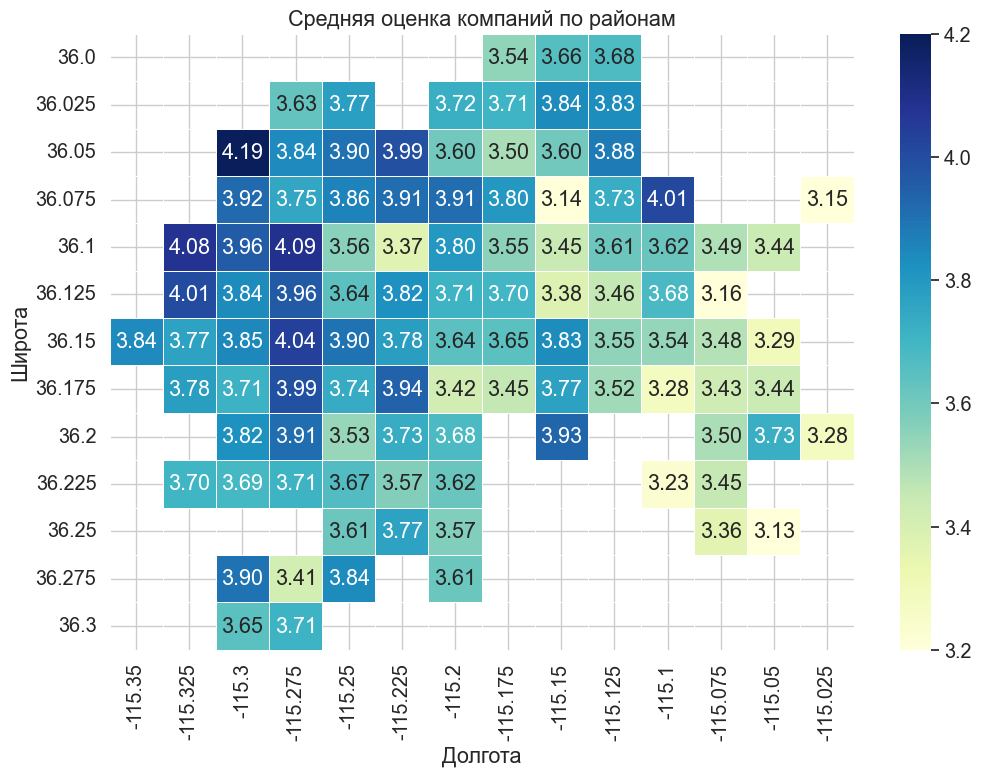

In [111]:
# Посчитаем среднее значение оценок и их количество по каждому району
area_avg_stars = main_data.groupby(['rounded_latitude', 'rounded_longitude'])['average_stars'].aggregate(['mean', 'size']).reset_index()
# Оставим районы только с количеством компаний больше 30
area_avg_stars = area_avg_stars[area_avg_stars['size'] >= 30]
pivot_table = pd.pivot_table(area_avg_stars, values = 'mean', index='rounded_latitude', columns='rounded_longitude', aggfunc='mean')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=.5, vmin=3.2, vmax=4.2)
plt.title('Средняя оценка компаний по районам')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()

Сравните полученный график с предыдущим и сделайте вывод.

**Вывод:** Сравнивая два графика можно заметить, что на втором графике меньше выбросов оценок, а именно нет районов с слишком высокой оценкой и слишком низкой оценкой. Также на первом графике выделяются районы с особо низкой оценкой из-за чего не сильно различаются районы с оценками 3-4.

#### 3. Рестораны

Будем считать компанию рестораном, если в поле `categories` *содержится* слово `restaurant`. Обратите внимание, что в анализе данных часто нет четкого формата данных. Например, данное слово может быть написано как с большой буквы, так и с маленькой; может как разделяться `;`, так и не разделяться. При возникновении недопонимания стоит посмотреть данные.

Составьте таблицу, в которой будет информация о всех ресторанах города `N`, для которых имеется не менее $5$ отзывов. Далее постройте heatmap-график районов, в котором каждому району сопоставьте среднюю оценку по ресторанам этого района. Рассматривайте только те районы, в которых есть не менее $10$ ресторанов, для каждого из которых есть не менее $5$ отзывов.

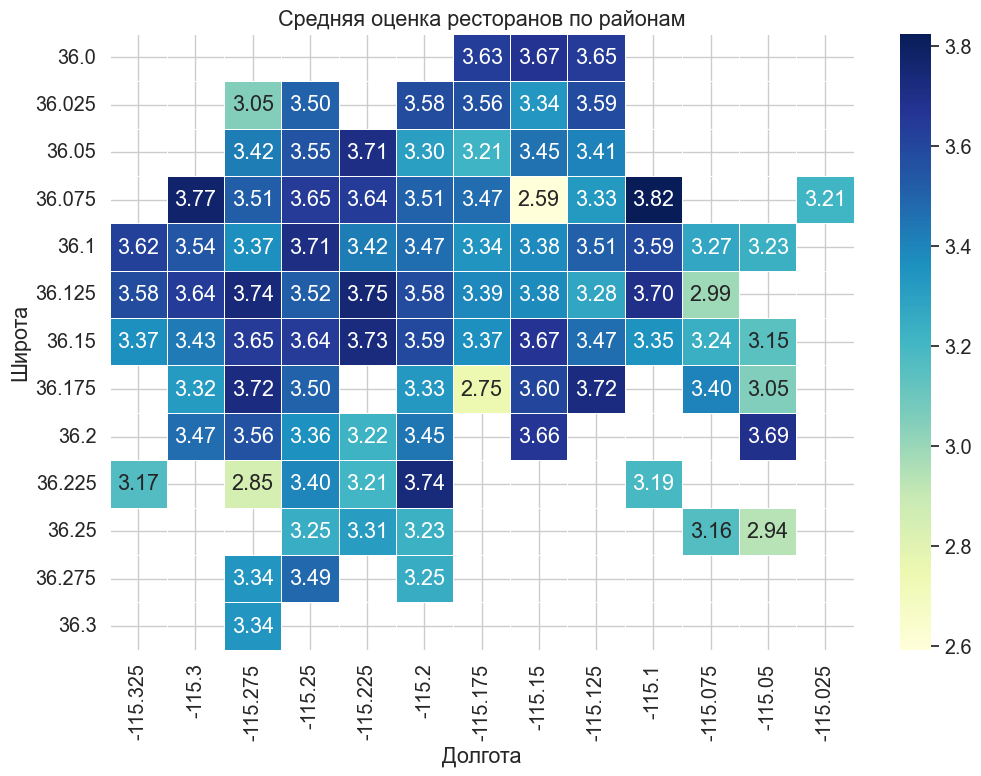

In [112]:
# Оставим только данные о ресторанах
restaurant_data = main_data[main_data['categories'].str.contains('restaurant', case=False, na=False, regex=True)]
# Выберем рестораны с не менее чем 5 отзывами
restaurant_data = restaurant_data[restaurant_data['count'] >= 5]
# Посчитаем среднюю оценку и количество ресторанов по районам и оставим районы в которых не менее 10 ресторанов
restaurant_data = restaurant_data.groupby(['rounded_latitude', 'rounded_longitude'])['average_stars'].aggregate(['mean', 'size']).reset_index()
restaurant_data = restaurant_data[restaurant_data['size'] >= 10]
pivot_table = pd.pivot_table(restaurant_data, values = 'mean', index='rounded_latitude', columns='rounded_longitude', aggfunc='mean')
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_table, cmap="YlGnBu", annot=True, fmt=".2f", linewidths=.5)
plt.title('Средняя оценка ресторанов по районам')
plt.xlabel('Долгота')
plt.ylabel('Широта')
plt.show()

Чем полезны ограничения снизу на количество отзывов для ресторана и количество ресторанов в районе?

**Ответ:** 
Во-первых ограничивая снизу количество оценки на рестораны мы исключаем большинство выбросов, так как рестораны с малым числом отзывов чаще всего подвержено слишком большой или слишком малой оценке. Аналогично с ограничением количества ресторанов в районе. Во-вторых если у ресторана всего несколько отзывов, оценка может быть сильно подвержена случайным вариациям и может быть не очень репрезентативной. Установка минимального порога для количества отзывов помогает убедиться, что оценка более стабильна и отражает реальное качество обслуживания. Аналогично с количеством ресторанов в районе.

Кот Василий из города `N` очень придирчив к выбору ресторана. Он доверяет только ресторанам с высоким рейтингом, который основывается на большом количестве отзывов. Напечатайте в виде таблицы информацию $10$ ресторанах с самым большим рейтингом в порядке убывания рейтинга. Для каждого из этих ресторанов должно быть не менее $50$ отзывов. По каждому ресторану необходимо вывести следующую информации: название ресторана, средняя оценка, количество отзывов, географические координаты, категории.

In [113]:
# Опять выберем данные о ресторанах и оставим только те у которых не менее 50 отзывов
restaurant_data = main_data[main_data['categories'].str.contains('restaurant', case=False, na=False, regex=True)]
restaurant_data = restaurant_data[restaurant_data['count'] >= 50]
# Отсортируем их по средней оценке
sorted_restaurant_data = restaurant_data.sort_values(by = 'average_stars', ascending = False)
# Выведем первые 10
sorted_restaurant_data.head(10)

,business_id,latitude,longitude,categories,name,average_stars,count,rounded_longitude,rounded_latitude
3560,iBPyahdJRP5y0t25fF2W9w,36.114537,-115.172678,Food Tours;Restaurants;Event Planning & Servic...,"""Lip Smacking Foodie Tours""",4.966480,179,-115.175,36.125
25153,Fmij544FE1iOruoxI41kew,36.152477,-115.151945,Restaurants;Burgers;Food Stands;Sandwiches;Hot...,"""Pepito Shack""",4.907692,65,-115.150,36.150
16436,qw9SyduMZ53KB6GlBQqvZQ,36.125960,-115.184846,Vietnamese;Bubble Tea;Sandwiches;Food;Coffee &...,"""Bosa Boba Cafe""",4.890909,55,-115.175,36.125
25473,k9b96JXlNewj36ddrce9Jw,36.166783,-115.286197,Tacos;Street Vendors;Farmers Market;Vegetarian...,"""Garden Grill""",4.868132,91,-115.275,36.175
2103,IhNASEZ3XnBHmuuVnWdIwA,36.054195,-115.242443,Cafes;Tea Rooms;Food;Bubble Tea;Restaurants;De...,"""Brew Tea Bar""",4.854232,1276,-115.250,36.050
18751,k5ddmLvAKKw9zSusRPM2cQ,36.116549,-115.088115,Food Stands;Hot Dogs;Caterers;Restaurants;Amer...,"""Poppa Naps BBQ""",4.836538,104,-115.100,36.125
11888,8fFTJBh0RB2EKG53ibiBKw,36.101741,-115.100359,Restaurants;Breakfast & Brunch;Cafes,"""Zenaida's Cafe""",4.833333,180,-115.100,36.100
11792,l1GJnB9TJgGgEeI4at1M0A,36.098527,-115.148446,Caterers;Mexican;Restaurants;Food;Event Planni...,"""El Frescos Cocina Mexicana""",4.816754,191,-115.150,36.100
5282,hFT3HuxVZJb1uYEsYfp-0A,36.159742,-115.232738,Adult Entertainment;Lounges;Hookah Bars;Restau...,"""Blaqcat Ultra Hookah Lounge""",4.809524,63,-115.225,36.150
25043,1CaM8eIvl41l4f3V-V-cAw,36.167894,-115.140238,Juice Bars & Smoothies;Restaurants;Sandwiches;...,"""Smooth Eats""",4.807018,57,-115.150,36.175


Нанесите на карту все рестораны со средней оценкой не менее $4.7$, которая посчитана по не менее $50$ отзывам. Отдельным цветом отметьте 10 ресторанов, которые вы получили ранее.

In [114]:
# Выберем рестораны с оценкой не менее 4.7
sorted_restaurant_data = sorted_restaurant_data[sorted_restaurant_data['average_stars'] >= 4.7]
restaurant_top_10 = sorted_restaurant_data.head(10)
fig = px.scatter_mapbox(sorted_restaurant_data,
                        lat="latitude", 
                        lon="longitude", 
                        color = 'average_stars', 
                        hover_name="name", 
                        zoom=11, 
                        title = "Интерактивная карта лучших ресторанов Лас Вегаса",
                        height=800)
fig.update_layout(mapbox_style="carto-positron")
# Отдельно изобразим первые 10 ресторанов по оценке
fig.add_trace(px.scatter_mapbox(
    restaurant_top_10,
    lat='latitude',
    lon='longitude',
    color='average_stars',
    size='average_stars',
    hover_name='name',
    color_continuous_scale=px.colors.sequential.Viridis,
).data[0])
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Охарактеризуйте кота Василия, а также сделайте общий вывод по задаче.

**Вывод:** 
Кот Василий проявляет высокие стандарты при выборе ресторанов, предпочитая те, которые имеют высокий рейтинг, основанный на большом количестве отзывов (не менее 50). Это свидетельствует о его стремлении доверять тем местам, которые имеют более стабильные и репрезентативные оценки, исключая влияние случайных или неадекватных отзывов. Решая данную задачу мы научились:
1. Правильно выбирать данные и отбрасывать лишние данные, которые не помогут в анализе, а наоборот могут искажать восприятие.
2. Адаптация к потребностям пользователя. Мы научились правильно использовать фильтрации и сортировки данных, которые позволяет адаптировать анализ к конкретным требованиям пользователя.
3. Научились строить различные интерактивные карты и работать с ними.